# Лабораторная работа №8 (Проведение исследований моделями обнаружения и распознавания объектов)

# 1. Выбор начальных условий

## 1.a Выбрать набор данных для задачи классификации (у каждого студента должен быть уникальный набор данных) и обосновать его выбор (реальная практическая задача)

В этой лабораторной работе было решено использовать [датасет](https://www.kaggle.com/datasets/slavkoprytula/aquarium-data-cots) подводных животных.

Обнаружение такого рода объектов может быть использовано, к примеру, для съемок документальных фильмов о морских обитателях.

In [1]:
import kagglehub

path = kagglehub.dataset_download("slavkoprytula/aquarium-data-cots")

print("Path to dataset files:", path)

Path to dataset files: /home/jupyter/.cache/kagglehub/datasets/slavkoprytula/aquarium-data-cots/versions/1


In [2]:
%pip install ultralytics

Defaulting to user installation because normal site-packages is not writeable
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 60.7 MB/s eta 0:00:00a 0:00:01
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cupy-cuda11x 11.0.0 requires numpy<1.26,>=1.20, but you have numpy 1.26.4 which is incompatible.
cvxpy 1.3.2 requires setuptools>65.5.1, but you have setuptools 65.5.0 which is incompatible.
numba 0.56.4 requires numpy<1.24,>=1.18, but you have numpy 1.26.4 which is incompatible.
tensorflow 2.12.0 requires numpy<1.24,>=1.22, but you have numpy 1.26.

Импорт необходимых библиотек

In [2]:
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from tqdm import tqdm
from sklearn.metrics import precision_recall_curve, average_precision_score, confusion_matrix

import torch
from ultralytics import YOLO

Проведем анализ датасета и посмотрим на распределение классов

In [ ]:
train_dir = os.path.join(path, "aquarium_pretrain", "train")
test_dir = os.path.join(path, "aquarium_pretrain", "test")
val_dir = os.path.join(path, "aquarium_pretrain", "valid")

def analyze_dataset(data_dir):
    images_dir = os.path.join(data_dir, "images")
    labels_dir = os.path.join(data_dir, "labels")
    
    image_files = list(os.listdir(images_dir))
    label_files = list(os.listdir(labels_dir))
    
    classes = {}
    
    for label_file in tqdm(label_files, desc="Analyzing labels"):
        with open(os.path.join(labels_dir, label_file), 'r') as f:
            lines = f.readlines()
            for line in lines:
                parts = line.strip().split()
                if len(parts) >= 5:  # class_id x y w h
                    class_id = int(parts[0])
                    if class_id in classes:
                        classes[class_id] += 1
                    else:
                        classes[class_id] = 1
    
    print(f"Classes: {classes}")
    
    return {
        'num_images': len(image_files),
        'num_labels': len(label_files),
        'classes': classes
    }

print("Train")
train_stats = analyze_dataset(train_dir)
print("\nTest")
test_stats = analyze_dataset(test_dir)


Train


Analyzing labels: 100%|██████████| 448/448 [00:00<00:00, 2087.96it/s]


Classes: {0: 1961, 3: 175, 2: 330, 5: 78, 4: 259, 6: 136, 1: 385}

Test


Analyzing labels: 100%|██████████| 63/63 [00:00<00:00, 1717.41it/s]

Classes: {3: 35, 2: 82, 0: 249, 5: 11, 4: 38, 1: 154, 6: 15}


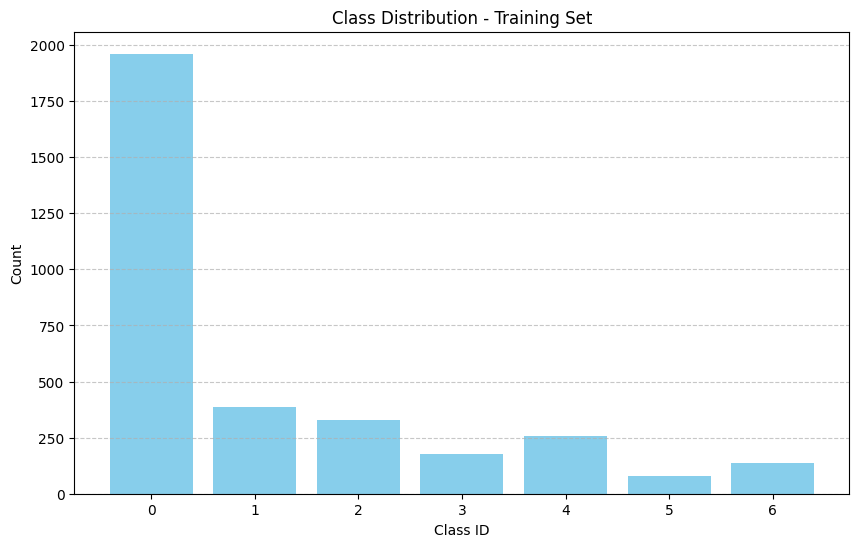

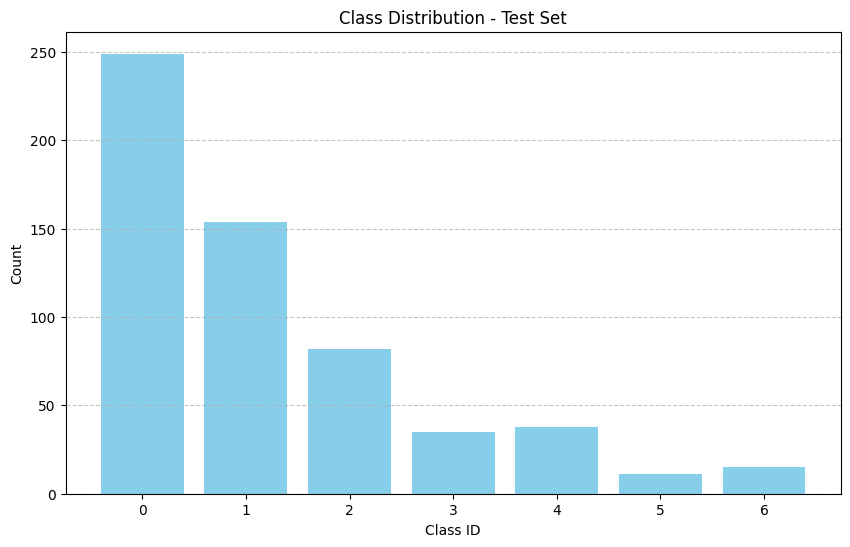

In [ ]:
def plot_class_distribution(dataset_stats, title):
    if not dataset_stats or 'classes' not in dataset_stats:
        print(f"Нет данных для {title}")
        return
    
    classes = dataset_stats['classes']
    class_ids = list(classes.keys())
    counts = list(classes.values())
    
    plt.figure(figsize=(10, 6))
    plt.bar(class_ids, counts, color='skyblue')
    plt.xlabel('Class ID')
    plt.ylabel('Count')
    plt.title(f'Class Distribution - {title}')
    plt.xticks(class_ids)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

if train_stats:
    plot_class_distribution(train_stats, "Training Set")
if test_stats:
    plot_class_distribution(test_stats, "Test Set")


Отрисуем несколько примеров тестовых данных

Примеры из тренировочного набора:


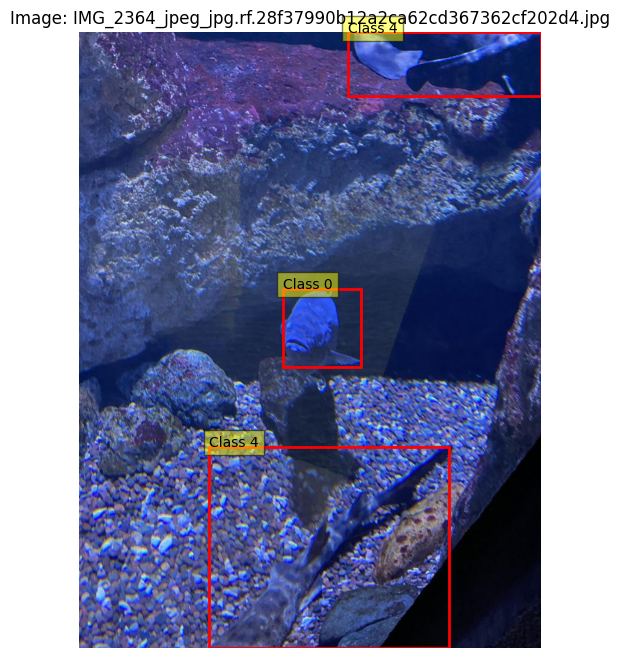

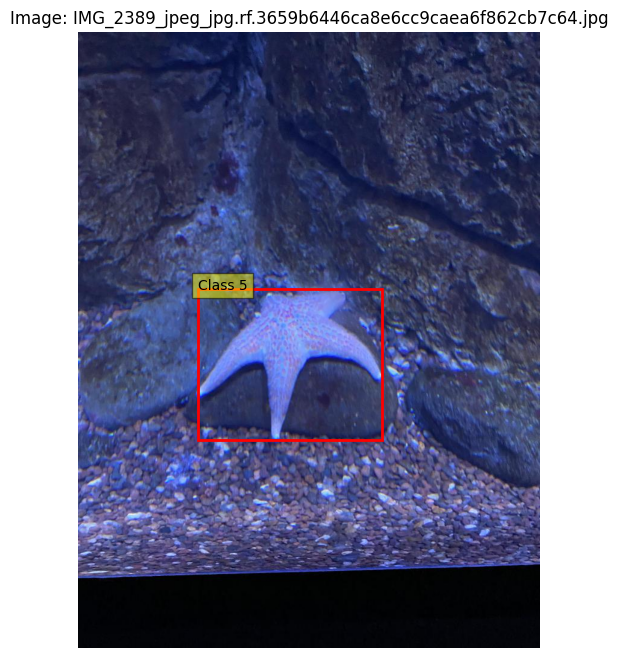

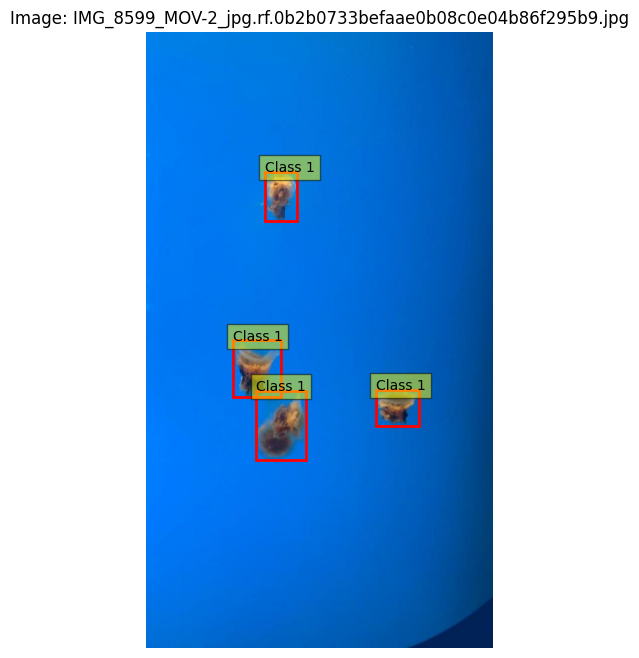

In [ ]:
def visualize_examples(data_dir, num_examples=3):
    images_dir = os.path.join(data_dir, "images")
    labels_dir = os.path.join(data_dir, "labels")
    
    image_files = list(os.listdir(images_dir))
    
    random_images = random.sample(image_files, min(num_examples, len(image_files)))
    
    for img_path in random_images:
        label_path = os.path.join(labels_dir, f"{img_path.strip('.jpg').strip('.png')}.txt")
        
        img = plt.imread(os.path.join(images_dir, f"{img_path}"))
        height, width = img.shape[0], img.shape[1]
        
        bboxes = []
        classes = []
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 5:
                    class_id = int(parts[0])
                    x_center, y_center, box_width, box_height = [float(x) for x in parts[1:5]]
                    
                    x1 = int((x_center - box_width / 2) * width)
                    y1 = int((y_center - box_height / 2) * height)
                    x2 = int((x_center + box_width / 2) * width)
                    y2 = int((y_center + box_height / 2) * height)
                    
                    bboxes.append((x1, y1, x2, y2))
                    classes.append(class_id)
        
        plt.figure(figsize=(10, 8))
        plt.imshow(img)
        plt.title(f"Image: {img_path}")
        
        for (x1, y1, x2, y2), class_id in zip(bboxes, classes):
            rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor='red', linewidth=2)
            plt.gca().add_patch(rect)
            plt.text(x1, y1, f'Class {class_id}', bbox=dict(facecolor='yellow', alpha=0.5))
        
        plt.axis('off')
        plt.show()

print("Примеры из тренировочного набора:")
visualize_examples(train_dir)


# 2. Создание бейзлайна и оценка качества
## 2.a. Обучение YOLO модели на выбранном наборе данных

Создадим конфигурационный YAML файл для YOLO

In [ ]:
def create_dataset_yaml(data_dir, yaml_path, class_names=None):
    if class_names is None:
        if train_stats and 'classes' in train_stats:
            num_classes = max(train_stats['classes'].keys()) + 1
            class_names = [f'class_{i}' for i in range(num_classes)]
        else:
            class_names = ['underwater_object']
    
    yaml_content = f"""
# Dataset path
path: {data_dir}
train: train/images
val: test/images 
test: test/images

# Classes
names:
"""
    for i, name in enumerate(class_names):
        yaml_content += f"  {i}: {name}\n"
    
    with open(yaml_path, 'w') as f:
        f.write(yaml_content)
    
    print(f"YAML config: {yaml_path}")
    return yaml_path

yaml_path = "underwater_dataset.yaml"
create_dataset_yaml(os.path.join(path, "aquarium_pretrain"), yaml_path)


YAML config: underwater_dataset.yaml


'underwater_dataset.yaml'

In [ ]:
def train_yolo_model(yaml_path, epochs=50, imgsz=640, batch=16, name="baseline"):
    model = YOLO('yolo11n.pt')
    
    results = model.train(
        data=yaml_path,
        epochs=epochs,
        imgsz=imgsz,
        batch=batch,
        name=name,
        patience=10,
        device=0 if torch.cuda.is_available() else 'cpu'
    )
    
    print(f"Обучение {name} завершено. Результаты сохранены в runs/detect/{name}")
    
    weights_path = f"runs/detect/{name}/weights/best.pt"
    return weights_path

baseline_weights = train_yolo_model(
    yaml_path=yaml_path,
    epochs=30,
    batch=16,
    name="baseline"
)


Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=underwater_dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=baseline2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, perspective=0.0, plots=True, pose=12.0, pretrained=True

train: Scanning /home/jupyter/.cache/kagglehub/datasets/slavkoprytula/aquarium-data-cots/versions/1/aquarium_pretrain/train/labels.cache... 448 images, 1 backgrounds, 0 corrupt: 100%|██████████| 448/448 [00:00<?, ?it/s]


albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'
val: Fast image access ✅ (ping: 0.3±0.0 ms, read: 35.8±16.6 MB/s, size: 100.7 KB)


val: Scanning /home/jupyter/.cache/kagglehub/datasets/slavkoprytula/aquarium-data-cots/versions/1/aquarium_pretrain/test/labels.cache... 63 images, 0 backgrounds, 0 corrupt: 100%|██████████| 63/63 [00:00<?, ?it/s]


Plotting labels to runs/detect/baseline2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/baseline2
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.52G      1.523      3.837      1.282        132        640: 100%|██████████| 28/28 [00:12<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all         63        584     0.0203      0.488     0.0713     0.0444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      3.08G      1.619      3.128      1.255        191        640: 100%|██████████| 28/28 [00:04<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.47it/s]

                   all         63        584     0.0164      0.528      0.152     0.0876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      3.08G      1.635      2.448      1.274        190        640: 100%|██████████| 28/28 [00:04<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.90it/s]

                   all         63        584       0.76      0.166      0.259      0.137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      3.08G      1.603      2.162       1.28        216        640: 100%|██████████| 28/28 [00:04<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.20it/s]

                   all         63        584      0.394      0.387      0.369      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      3.08G      1.568          2      1.263        318        640: 100%|██████████| 28/28 [00:04<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.45it/s]


                   all         63        584      0.506      0.476      0.467      0.266

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      3.08G      1.533      1.874       1.25        191        640: 100%|██████████| 28/28 [00:04<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.45it/s]


                   all         63        584      0.538      0.393      0.435      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      3.08G      1.493      1.753      1.238        202        640: 100%|██████████| 28/28 [00:04<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.57it/s]

                   all         63        584      0.807      0.437      0.525      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      3.08G      1.482      1.619       1.23        146        640: 100%|██████████| 28/28 [00:04<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.85it/s]

                   all         63        584      0.661      0.479      0.539      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      3.08G      1.443      1.561      1.209        185        640: 100%|██████████| 28/28 [00:04<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.04it/s]


                   all         63        584      0.663      0.523      0.594      0.357

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      3.08G      1.444      1.537      1.204        167        640: 100%|██████████| 28/28 [00:04<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.75it/s]

                   all         63        584      0.681      0.591      0.645      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      3.08G      1.436      1.587      1.203        302        640: 100%|██████████| 28/28 [00:04<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.24it/s]

                   all         63        584      0.653      0.596      0.651      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      3.08G      1.423      1.478      1.204        197        640: 100%|██████████| 28/28 [00:04<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.86it/s]

                   all         63        584      0.818      0.545      0.643      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      3.38G        1.4      1.469      1.181        245        640: 100%|██████████| 28/28 [00:04<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.69it/s]


                   all         63        584      0.691      0.607      0.615      0.347

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      3.38G      1.389      1.466      1.177        210        640: 100%|██████████| 28/28 [00:04<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.68it/s]


                   all         63        584      0.717      0.613      0.655      0.376

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      3.38G       1.38      1.369      1.151        155        640: 100%|██████████| 28/28 [00:04<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.94it/s]

                   all         63        584      0.694      0.671      0.707      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      3.38G      1.356      1.284      1.128        181        640: 100%|██████████| 28/28 [00:04<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.85it/s]


                   all         63        584      0.755      0.654      0.731       0.43

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      3.38G      1.357      1.299       1.14        191        640: 100%|██████████| 28/28 [00:04<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.51it/s]


                   all         63        584      0.812      0.672      0.753      0.449

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      3.38G      1.329      1.289      1.142        147        640: 100%|██████████| 28/28 [00:04<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.25it/s]

                   all         63        584      0.735      0.715      0.755      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      3.38G      1.314      1.228      1.132        170        640: 100%|██████████| 28/28 [00:04<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.23it/s]

                   all         63        584      0.767      0.639      0.729      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      3.38G      1.314      1.208      1.132        156        640: 100%|██████████| 28/28 [00:04<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.93it/s]


                   all         63        584      0.768      0.666      0.746      0.434
Closing dataloader mosaic
albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      3.38G      1.295      1.337      1.129        134        640: 100%|██████████| 28/28 [00:07<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.64it/s]

                   all         63        584      0.721      0.692      0.732      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      3.38G       1.29      1.211       1.11        108        640: 100%|██████████| 28/28 [00:04<00:00,  6.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.81it/s]

                   all         63        584      0.773      0.664      0.739       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      3.38G      1.253      1.185      1.099         88        640: 100%|██████████| 28/28 [00:04<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.05it/s]

                   all         63        584      0.772      0.631      0.724      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      3.38G       1.22      1.141      1.087         83        640: 100%|██████████| 28/28 [00:04<00:00,  6.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.48it/s]


                   all         63        584      0.776      0.669      0.753      0.453

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      3.38G      1.242       1.15      1.082         86        640: 100%|██████████| 28/28 [00:04<00:00,  6.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.17it/s]

                   all         63        584      0.834      0.669      0.782      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      3.38G      1.204      1.095      1.084         97        640: 100%|██████████| 28/28 [00:04<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.02it/s]

                   all         63        584      0.823       0.68      0.788      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      3.38G      1.188      1.068      1.065        136        640: 100%|██████████| 28/28 [00:04<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.58it/s]

                   all         63        584      0.806      0.689      0.774       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      3.38G      1.189      1.049      1.065        152        640: 100%|██████████| 28/28 [00:04<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.51it/s]

                   all         63        584      0.821      0.696       0.78      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      3.38G      1.156       1.05      1.056         97        640: 100%|██████████| 28/28 [00:04<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.86it/s]

                   all         63        584      0.845      0.663      0.779      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      3.38G      1.171      1.025      1.066         64        640: 100%|██████████| 28/28 [00:04<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.78it/s]

                   all         63        584      0.817      0.675      0.784      0.475



30 epochs completed in 0.053 hours.
Optimizer stripped from runs/detect/baseline2/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/baseline2/weights/best.pt, 5.5MB

Validating runs/detect/baseline2/weights/best.pt...
Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.29it/s]


                   all         63        584       0.84      0.664       0.78      0.479
               class_0         30        249      0.814      0.633      0.737      0.427
               class_1         11        154      0.795      0.844      0.872      0.545
               class_2          7         82      0.837      0.562      0.766      0.332
               class_3          6         35      0.833      0.427      0.515      0.227
               class_4         14         38      0.892      0.763      0.834      0.553
               class_5          5         11      0.944      0.818      0.956      0.668
               class_6         10         15      0.767        0.6      0.776      0.599
Speed: 0.9ms preprocess, 2.8ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/baseline2
Обучение baseline завершено. Результаты сохранены в runs/detect/baseline


## 2.b.	Оценить качество моделей по выбранным метрикам на выбранном наборе данных

Функция для валидации модели и получения метрик

In [ ]:
def evaluate_model(weights_path, yaml_path, imgsz=640, name="evaluation"):
    model = YOLO(weights_path)
    
    results = model.val(
        data=yaml_path,
        imgsz=imgsz,
        name=name
    )
    
    metrics = {
        'precision': results.results_dict['metrics/precision(B)'],
        'recall': results.results_dict['metrics/recall(B)'],
        'mAP50': results.results_dict['metrics/mAP50(B)'],
        'mAP50-95': results.results_dict['metrics/mAP50-95(B)']
    }
    
    print(f"Evaluation Results for {name}:")
    for metric, value in metrics.items():
        print(f"{metric}: {value:.4f}")
    
    return metrics

baseline_metrics = evaluate_model(
    weights_path=baseline_weights,
    yaml_path=yaml_path,
    name="baseline_eval"
)


Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 31.2±14.9 MB/s, size: 111.9 KB)


val: Scanning /home/jupyter/.cache/kagglehub/datasets/slavkoprytula/aquarium-data-cots/versions/1/aquarium_pretrain/test/labels.cache... 63 images, 0 backgrounds, 0 corrupt: 100%|██████████| 63/63 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:10<00:00,  2.56s/it]


                   all         63        584      0.837      0.661       0.78      0.479
               class_0         30        249      0.818      0.633      0.741      0.426
               class_1         11        154      0.787      0.838      0.873      0.544
               class_2          7         82      0.839       0.57      0.765      0.335
               class_3          6         35      0.831      0.429      0.514      0.227
               class_4         14         38      0.881      0.737      0.836      0.561
               class_5          5         11      0.941      0.818      0.956      0.657
               class_6         10         15       0.76        0.6      0.776      0.599
Speed: 2.5ms preprocess, 49.1ms inference, 0.0ms loss, 33.3ms postprocess per image
Results saved to runs/detect/baseline_eval11
Evaluation Results for baseline_eval:
precision: 0.8366
recall: 0.6607
mAP50: 0.7802
mAP50-95: 0.4786


Визуализируем предсказания в сравнении с целевыми метками


image 1/1 /home/jupyter/.cache/kagglehub/datasets/slavkoprytula/aquarium-data-cots/versions/1/aquarium_pretrain/test/images/IMG_2446_jpeg_jpg.rf.06ee05e92df8e3c33073147d8f595211.jpg: 640x480 6 class_0s, 3 class_4s, 64.1ms
Speed: 3.9ms preprocess, 64.1ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /home/jupyter/.cache/kagglehub/datasets/slavkoprytula/aquarium-data-cots/versions/1/aquarium_pretrain/test/images/IMG_8497_MOV-0_jpg.rf.5c59bd1bf7d8fd7a20999d51a79a12c0.jpg: 640x384 10 class_0s, 1 class_6, 57.5ms
Speed: 3.1ms preprocess, 57.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 384)

image 1/1 /home/jupyter/.cache/kagglehub/datasets/slavkoprytula/aquarium-data-cots/versions/1/aquarium_pretrain/test/images/IMG_2379_jpeg_jpg.rf.7dc3160c937072d26d4624c6c48e904d.jpg: 640x480 1 class_0, 7.4ms
Speed: 2.1ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /home/jupyter/.cache/kagglehub/datasets/sla

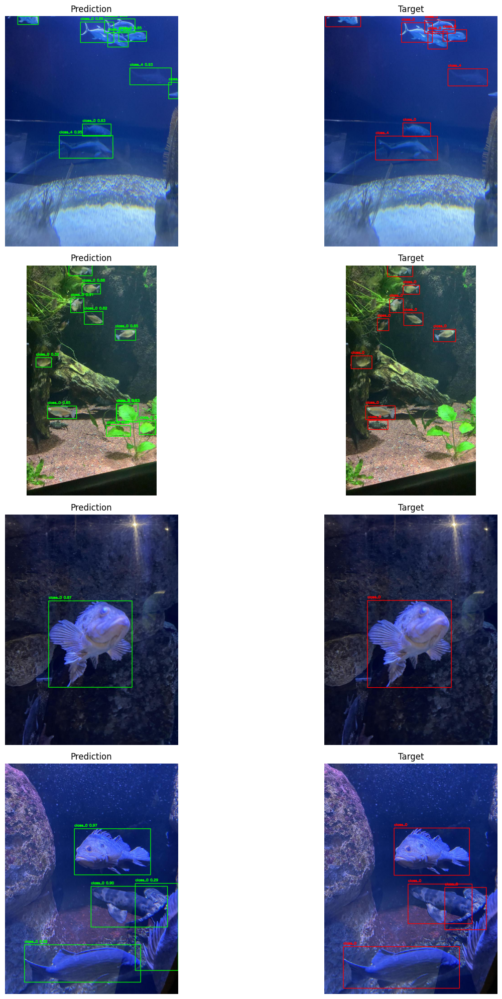

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
from pathlib import Path
from ultralytics import YOLO

def visualize_predictions_vs_targets(model_path, test_dir, num_examples=3):
    model = YOLO(model_path)
    
    test_images_dir = os.path.join(test_dir, "images")
    test_labels_dir = os.path.join(test_dir, "labels")
    
    test_images = list(os.listdir(test_images_dir))
    
    selected_images = random.sample(test_images, min(num_examples, len(test_images)))
    
    class_names = {
        0: 'class_0', 1: 'class_1', 2: 'class_2', 
        3: 'class_3', 4: 'class_4', 5: 'class_5', 6: 'class_6'
    }
    
    plt.figure(figsize=(16, 5 * len(selected_images)))
    
    for i, img_path in enumerate(selected_images):
        img = cv2.imread(str(os.path.join(test_images_dir, img_path)))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w, _ = img.shape
        
        results = model(os.path.join(test_images_dir, img_path), conf=0.25)
        
        img_pred = img.copy()
        img_target = img.copy()
        
        boxes = results[0].boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            conf = box.conf[0].item()
            cls_id = int(box.cls[0].item())
            
            cv2.rectangle(img_pred, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
            label = f"{class_names.get(cls_id, f'class_{cls_id}')} {conf:.2f}"
            cv2.putText(img_pred, label, (int(x1), int(y1) - 10), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        
        label_path = os.path.join(test_labels_dir, f"{img_path.strip('.png').strip('.jpg')}.txt")
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 5:
                    cls_id = int(parts[0])
                    x_center, y_center, width, height = [float(x) for x in parts[1:5]]
                    
                    x1 = int((x_center - width / 2) * w)
                    y1 = int((y_center - height / 2) * h)
                    x2 = int((x_center + width / 2) * w)
                    y2 = int((y_center + height / 2) * h)
                    
                    cv2.rectangle(img_target, (x1, y1), (x2, y2), (255, 0, 0), 2)
                    label = f"{class_names.get(cls_id, f'class_{cls_id}')}"
                    cv2.putText(img_target, label, (x1, y1 - 10), 
                                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
        
        plt.subplot(len(selected_images), 2, i*2 + 1)
        plt.title(f"Prediction")
        plt.imshow(img_pred)
        plt.axis('off')
        
        plt.subplot(len(selected_images), 2, i*2 + 2)
        plt.title(f"Target")
        plt.imshow(img_target)
        plt.axis('off')
    
    plt.tight_layout()
    plt.savefig('predictions_vs_targets.png', dpi=300, bbox_inches='tight')
    plt.show()

model_path = "runs/detect/baseline/weights/best.pt"

visualize_predictions_vs_targets(model_path, test_dir, num_examples=4)


И из метрик, и визуально видно, что модель довольно хорошо находит нужные объекты при условии, что размер train датасета содержит всего около 60 изображений

# 3. Улучшение бейзлайна
## 3.a. Сформулировать гипотезы (аугментации данных, подбор моделей, подбор гиперпараметров и т.д.)

Попробуем увеличить размер изображения, чтобы сделать объекты заметнее

Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2016.0±1148.5 MB/s, size: 111.8 KB)


val: Scanning /home/jupyter/.cache/kagglehub/datasets/slavkoprytula/aquarium-data-cots/versions/1/aquarium_pretrain/test/labels.cache... 63 images, 0 backgrounds, 0 corrupt: 100%|██████████| 63/63 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:08<00:00,  2.20s/it]


                   all         63        584      0.837      0.661       0.78      0.479
               class_0         30        249      0.818      0.633      0.741      0.426
               class_1         11        154      0.787      0.838      0.873      0.544
               class_2          7         82      0.839       0.57      0.765      0.335
               class_3          6         35      0.831      0.429      0.514      0.227
               class_4         14         38      0.881      0.737      0.836      0.561
               class_5          5         11      0.941      0.818      0.956      0.657
               class_6         10         15       0.76        0.6      0.776      0.599
Speed: 3.7ms preprocess, 4.1ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to runs/detect/baseline_eval13
Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GF

val: Scanning /home/jupyter/.cache/kagglehub/datasets/slavkoprytula/aquarium-data-cots/versions/1/aquarium_pretrain/test/labels.cache... 63 images, 0 backgrounds, 0 corrupt: 100%|██████████| 63/63 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:07<00:00,  1.84s/it]


                   all         63        584      0.826       0.72      0.779      0.471
               class_0         30        249      0.798      0.679       0.77      0.446
               class_1         11        154      0.739      0.877      0.854      0.525
               class_2          7         82      0.796      0.671       0.72      0.318
               class_3          6         35      0.701      0.457      0.465      0.239
               class_4         14         38      0.932      0.789       0.86      0.615
               class_5          5         11      0.898      0.799        0.9      0.592
               class_6         10         15       0.92      0.772      0.882      0.562
Speed: 6.7ms preprocess, 75.7ms inference, 0.0ms loss, 13.2ms postprocess per image
Results saved to runs/detect/larger_imgsz_eval10
        model  precision    recall     mAP50  mAP50-95
0    Baseline   0.836645  0.660673  0.780171  0.478643
1  Hypothesis   0.826033  0.720431  0.778740 

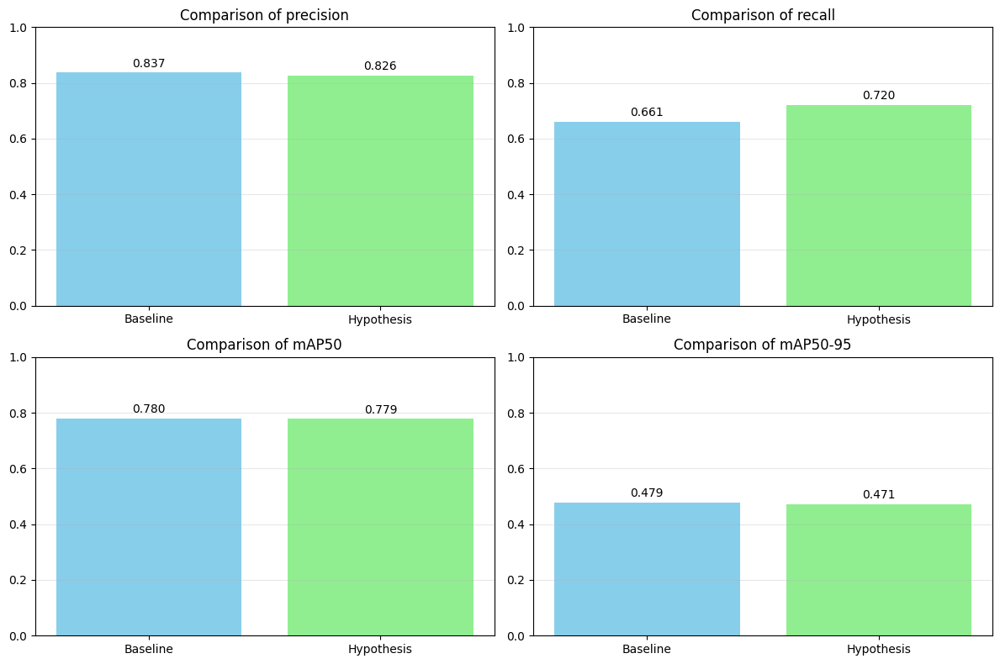

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def train_yolo_larger_imgsz(yaml_path, imgsz=800, epochs=30, name="larger_imgsz"):
    model = YOLO(f'yolo11n.pt')
    
    results = model.train(
        data=yaml_path,
        epochs=epochs,
        imgsz=imgsz,       
        batch=16,
        name=name,
        patience=15,       
        device=0 if torch.cuda.is_available() else 'cpu',
    )
    
    print(f"Обучение {name} завершено. Результаты сохранены в runs/detect/{name}")
    
    weights_path = f"runs/detect/{name}/weights/best.pt"
    return weights_path

def evaluate_and_compare_models(baseline_weights, hypothesis_weights, yaml_path):
    baseline_model = YOLO(baseline_weights)
    baseline_results = baseline_model.val(data=yaml_path, imgsz=640, name="baseline_eval")
    
    hypothesis_model = YOLO(hypothesis_weights)
    hypothesis_results = hypothesis_model.val(data=yaml_path, imgsz=800, name="larger_imgsz_eval")

    baseline_metrics = {
        'model': 'Baseline',
        'precision': baseline_results.results_dict['metrics/precision(B)'],
        'recall': baseline_results.results_dict['metrics/recall(B)'],
        'mAP50': baseline_results.results_dict['metrics/mAP50(B)'],
        'mAP50-95': baseline_results.results_dict['metrics/mAP50-95(B)']
    }
    
    hypothesis_metrics = {
        'model': 'Hypothesis',
        'precision': hypothesis_results.results_dict['metrics/precision(B)'],
        'recall': hypothesis_results.results_dict['metrics/recall(B)'],
        'mAP50': hypothesis_results.results_dict['metrics/mAP50(B)'],
        'mAP50-95': hypothesis_results.results_dict['metrics/mAP50-95(B)']
    }
    
    metrics_df = pd.DataFrame([baseline_metrics, hypothesis_metrics])
    print(metrics_df)
    
    plt.figure(figsize=(12, 8))
    metrics = ['precision', 'recall', 'mAP50', 'mAP50-95']
    
    for i, metric in enumerate(metrics):
        plt.subplot(2, 2, i+1)
        plt.bar(['Baseline', 'Hypothesis'], 
                [baseline_metrics[metric], hypothesis_metrics[metric]], 
                color=['skyblue', 'lightgreen'])
        plt.title(f'Comparison of {metric}')
        plt.ylim(0, 1.0)
        plt.grid(axis='y', alpha=0.3)
        
        for j, v in enumerate([baseline_metrics[metric], hypothesis_metrics[metric]]):
            plt.text(j, v + 0.02, f"{v:.3f}", ha='center')
    
    plt.tight_layout()
    plt.savefig('hypothesis_comparison.png')
    plt.show()
    
    return metrics_df

yaml_path = "underwater_dataset.yaml"

baseline_weights = "runs/detect/baseline/weights/best.pt"

larger_imgsz_weights = train_yolo_larger_imgsz(
    model_size='n',
    yaml_path=yaml_path,
    imgsz=800,
    epochs=30,
    name="larger_imgsz"
)

comparison_df = evaluate_and_compare_models(baseline_weights, larger_imgsz_weights, yaml_path)


Результаты получились схожими, но recall увеличился. В контекста данного датасета это можно считать хорошим признаком

Двухэтапное обучение более крупной модели YOLOv11m

Step 1


100%|██████████| 38.8M/38.8M [00:00<00:00, 66.6MB/s]


Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=underwater_dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.0001, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo11m_two_stage_stage1, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=15, perspective=0.0, plots=True, pose=12.0,

train: Scanning /home/jupyter/.cache/kagglehub/datasets/slavkoprytula/aquarium-data-cots/versions/1/aquarium_pretrain/train/labels.cache... 448 images, 1 backgrounds, 0 corrupt: 100%|██████████| 448/448 [00:00<?, ?it/s]

albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'


val: Fast image access ✅ (ping: 0.3±0.0 ms, read: 134.3±59.2 MB/s, size: 100.7 KB)


val: Scanning /home/jupyter/.cache/kagglehub/datasets/slavkoprytula/aquarium-data-cots/versions/1/aquarium_pretrain/test/labels.cache... 63 images, 0 backgrounds, 0 corrupt: 100%|██████████| 63/63 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolo11m_two_stage_stage1/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/yolo11m_two_stage_stage1
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      5.24G      1.546      2.477      1.325         64        640: 100%|██████████| 56/56 [00:16<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.65it/s]

                   all         63        584      0.278      0.292      0.199      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      5.26G       1.64      2.034      1.368        102        640: 100%|██████████| 56/56 [00:13<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.43it/s]

                   all         63        584       0.33      0.255      0.187     0.0886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      5.26G      1.678      1.994      1.425         55        640: 100%|██████████| 56/56 [00:13<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.08it/s]

                   all         63        584      0.406      0.314      0.327      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      5.26G      1.658      1.822      1.408        109        640: 100%|██████████| 56/56 [00:13<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.30it/s]


                   all         63        584      0.376      0.401       0.37      0.185

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      5.26G        1.6      1.694       1.36         96        640: 100%|██████████| 56/56 [00:13<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.40it/s]

                   all         63        584      0.418      0.427      0.442      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      5.26G      1.558      1.642      1.363        132        640: 100%|██████████| 56/56 [00:13<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.62it/s]

                   all         63        584      0.443      0.542      0.446       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      5.26G       1.54      1.592      1.348         93        640: 100%|██████████| 56/56 [00:13<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.51it/s]

                   all         63        584      0.533      0.542      0.521       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      5.26G      1.531      1.516      1.338         83        640: 100%|██████████| 56/56 [00:13<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.50it/s]

                   all         63        584      0.634      0.471      0.546      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      5.26G      1.475      1.435      1.319         67        640: 100%|██████████| 56/56 [00:13<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.53it/s]

                   all         63        584      0.645      0.597      0.629      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      5.26G      1.497      1.415      1.329         80        640: 100%|██████████| 56/56 [00:13<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.64it/s]

                   all         63        584      0.585      0.612       0.61      0.339


Closing dataloader mosaic
albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      5.26G       1.45      1.387      1.315         39        640: 100%|██████████| 56/56 [00:14<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.57it/s]

                   all         63        584      0.638       0.68      0.685      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      5.26G      1.364      1.292      1.275         31        640: 100%|██████████| 56/56 [00:13<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.58it/s]

                   all         63        584      0.696      0.654      0.704        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      5.26G      1.377      1.207      1.255         47        640: 100%|██████████| 56/56 [00:13<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.53it/s]

                   all         63        584      0.727       0.63      0.717       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      5.26G      1.311      1.171      1.233         33        640: 100%|██████████| 56/56 [00:13<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.51it/s]

                   all         63        584      0.709      0.649      0.717      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      5.26G       1.29      1.065      1.191         54        640: 100%|██████████| 56/56 [00:13<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.70it/s]

                   all         63        584      0.786      0.632      0.741      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      5.26G      1.297      1.036      1.229         34        640: 100%|██████████| 56/56 [00:13<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.57it/s]

                   all         63        584      0.778      0.688      0.769      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      5.26G      1.245     0.9752      1.189         54        640: 100%|██████████| 56/56 [00:13<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.58it/s]

                   all         63        584       0.79      0.671      0.771      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      5.26G      1.234     0.9591       1.18         51        640: 100%|██████████| 56/56 [00:13<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.54it/s]

                   all         63        584      0.748      0.702      0.764      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      5.26G      1.222     0.9349      1.166         40        640: 100%|██████████| 56/56 [00:13<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.61it/s]

                   all         63        584      0.768      0.671      0.764      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      5.26G      1.221     0.9401      1.165         58        640: 100%|██████████| 56/56 [00:13<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.48it/s]

                   all         63        584      0.797      0.665      0.771      0.459



20 epochs completed in 0.160 hours.
Optimizer stripped from runs/detect/yolo11m_two_stage_stage1/weights/last.pt, 40.5MB
Optimizer stripped from runs/detect/yolo11m_two_stage_stage1/weights/best.pt, 40.5MB

Validating runs/detect/yolo11m_two_stage_stage1/weights/best.pt...
Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLO11m summary (fused): 125 layers, 20,035,429 parameters, 0 gradients, 67.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:09<00:00,  2.33s/it]


                   all         63        584      0.769      0.674      0.764      0.469
               class_0         30        249      0.797       0.57      0.723      0.441
               class_1         11        154      0.792      0.812      0.881      0.572
               class_2          7         82      0.784      0.646      0.781      0.347
               class_3          6         35      0.666        0.4      0.487      0.205
               class_4         14         38      0.719      0.737      0.793      0.526
               class_5          5         11      0.926      0.818      0.922      0.664
               class_6         10         15      0.699      0.733      0.763      0.526
Speed: 0.8ms preprocess, 110.8ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/yolo11m_two_stage_stage1

Step 2
Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True,

train: Scanning /home/jupyter/.cache/kagglehub/datasets/slavkoprytula/aquarium-data-cots/versions/1/aquarium_pretrain/train/labels.cache... 448 images, 1 backgrounds, 0 corrupt: 100%|██████████| 448/448 [00:00<?, ?it/s]

albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 527.7±189.1 MB/s, size: 100.7 KB)


val: Scanning /home/jupyter/.cache/kagglehub/datasets/slavkoprytula/aquarium-data-cots/versions/1/aquarium_pretrain/test/labels.cache... 63 images, 0 backgrounds, 0 corrupt: 100%|██████████| 63/63 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolo11m_two_stage_stage2/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/yolo11m_two_stage_stage2
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      4.84G       1.78     0.6695      1.645         39        640: 100%|██████████| 56/56 [00:15<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.41it/s]

                   all         63        584      0.749      0.622      0.698      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      5.89G      1.674     0.6205       1.59         48        640: 100%|██████████| 56/56 [00:13<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.53it/s]

                   all         63        584      0.763      0.686       0.76      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      5.89G       1.64     0.5896      1.567         59        640: 100%|██████████| 56/56 [00:13<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.56it/s]

                   all         63        584      0.739      0.707      0.762      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      5.89G      1.607     0.5532      1.536         58        640: 100%|██████████| 56/56 [00:13<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.70it/s]

                   all         63        584      0.813      0.665      0.759      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      5.89G      1.594     0.5656      1.532         37        640: 100%|██████████| 56/56 [00:13<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.68it/s]

                   all         63        584      0.773      0.687      0.767      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      5.89G      1.596     0.5497      1.542         77        640: 100%|██████████| 56/56 [00:13<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.66it/s]

                   all         63        584      0.727      0.728      0.758      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      5.89G      1.557     0.5314      1.523         71        640: 100%|██████████| 56/56 [00:13<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.65it/s]

                   all         63        584       0.76      0.688      0.769      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      5.89G      1.548     0.5313      1.516         43        640: 100%|██████████| 56/56 [00:13<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.69it/s]

                   all         63        584      0.764      0.694      0.773      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      5.89G      1.551     0.5193      1.507         92        640: 100%|██████████| 56/56 [00:13<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.61it/s]

                   all         63        584      0.764      0.702      0.769      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      5.89G      1.552     0.5292      1.524         98        640: 100%|██████████| 56/56 [00:13<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.61it/s]

                   all         63        584       0.76        0.7      0.769      0.471



10 epochs completed in 0.080 hours.
Optimizer stripped from runs/detect/yolo11m_two_stage_stage2/weights/last.pt, 40.5MB
Optimizer stripped from runs/detect/yolo11m_two_stage_stage2/weights/best.pt, 40.5MB

Validating runs/detect/yolo11m_two_stage_stage2/weights/best.pt...
Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLO11m summary (fused): 125 layers, 20,035,429 parameters, 0 gradients, 67.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:09<00:00,  2.29s/it]


                   all         63        584      0.703      0.709      0.756      0.464
               class_0         30        249      0.724      0.643       0.74      0.465
               class_1         11        154      0.759       0.87      0.891      0.572
               class_2          7         82       0.73      0.671      0.724      0.346
               class_3          6         35      0.756      0.443      0.518      0.217
               class_4         14         38      0.703      0.763      0.814      0.534
               class_5          5         11      0.743      0.909      0.884       0.62
               class_6         10         15      0.509      0.667      0.721      0.496
Speed: 1.8ms preprocess, 21.1ms inference, 0.0ms loss, 15.5ms postprocess per image
Results saved to runs/detect/yolo11m_two_stage_stage2
Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradie

val: Scanning /home/jupyter/.cache/kagglehub/datasets/slavkoprytula/aquarium-data-cots/versions/1/aquarium_pretrain/test/labels.cache... 63 images, 0 backgrounds, 0 corrupt: 100%|██████████| 63/63 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:08<00:00,  2.01s/it]


                   all         63        584      0.844      0.666      0.786      0.483
               class_0         30        249      0.819      0.617       0.74      0.428
               class_1         11        154      0.793      0.838      0.872      0.544
               class_2          7         82      0.852      0.563      0.762      0.333
               class_3          6         35      0.832      0.426      0.514      0.227
               class_4         14         38      0.885      0.737      0.837      0.562
               class_5          5         11      0.944      0.818      0.956      0.657
               class_6         10         15      0.784      0.667       0.82      0.628
Speed: 3.0ms preprocess, 23.7ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to runs/detect/baseline_eval5
Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLO11m summary (fused): 125 layers, 20,035,429 parameters, 0 gradients, 67.7 

val: Scanning /home/jupyter/.cache/kagglehub/datasets/slavkoprytula/aquarium-data-cots/versions/1/aquarium_pretrain/test/labels.cache... 63 images, 0 backgrounds, 0 corrupt: 100%|██████████| 63/63 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:09<00:00,  2.27s/it]


                   all         63        584      0.752       0.71      0.755      0.459
               class_0         30        249       0.72      0.693      0.764       0.46
               class_1         11        154      0.799      0.838      0.883      0.561
               class_2          7         82      0.716      0.739      0.787      0.356
               class_3          6         35      0.744      0.416      0.532       0.22
               class_4         14         38      0.745       0.77      0.791      0.576
               class_5          5         11      0.811      0.783      0.812      0.602
               class_6         10         15      0.727      0.733      0.717      0.436
Speed: 3.8ms preprocess, 73.4ms inference, 0.0ms loss, 27.4ms postprocess per image
Results saved to runs/detect/larger_imgsz_eval4
        model  precision    recall     mAP50  mAP50-95
0    Baseline   0.844088  0.666407  0.786153  0.482762
1  Hypothesis   0.751904  0.710151  0.755037  

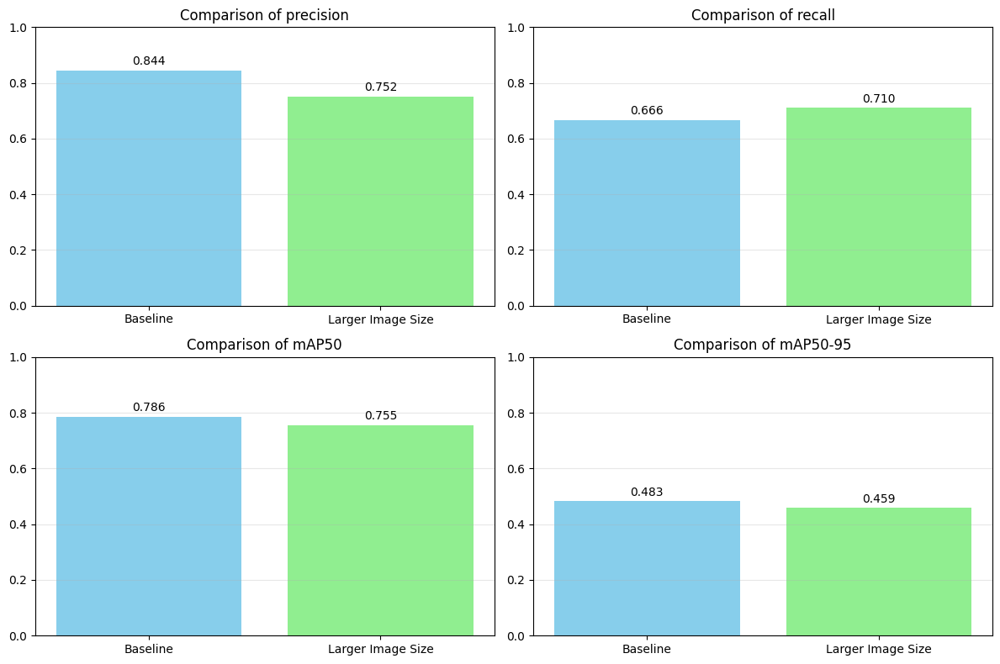

In [ ]:
def train_yolo_two_stage(yaml_path, epochs_stage1=20, epochs_stage2=10, name="yolo11m_two_stage"):
    print("Step 1")
    model = YOLO('yolo11m.pt')
    
    results_stage1 = model.train(
        data=yaml_path,
        epochs=epochs_stage1,
        imgsz=640,
        batch=8,
        name=f"{name}_stage1",
        patience=15,
        device=0 if torch.cuda.is_available() else 'cpu',
        augment=True,
        lr0=0.001,
        lrf=0.0001,
        cos_lr=True,
        optimizer='AdamW'
    )
    
    stage1_weights = f"runs/detect/{name}_stage1/weights/best.pt"
    
    print("\nStep 2")
    
    model_stage2 = YOLO(stage1_weights)
    
    results_stage2 = model_stage2.train(
        data=yaml_path,
        epochs=epochs_stage2,
        imgsz=640,
        batch=8,
        name=f"{name}_stage2",
        patience=10,
        device=0 if torch.cuda.is_available() else 'cpu',
        augment=True,
        lr0=0.0001,
        lrf=0.00001,
        cos_lr=True,
        optimizer='AdamW',
        box=10.0,
        cls=0.3,
        dfl=2.0
    )
    
    final_weights = f"runs/detect/{name}_stage2/weights/best.pt"
    return final_weights

yaml_path = "underwater_dataset.yaml"

baseline_weights = "runs/detect/baseline/weights/best.pt"

two_stage_weights = train_yolo_two_stage(
    yaml_path=yaml_path,
    epochs_stage1=20,
    epochs_stage2=10,
    name="yolo11m_two_stage"
)

comparison_df = evaluate_and_compare_models(baseline_weights, two_stage_weights, yaml_path)

Эта гипотеза также дала повышение recall, однако сильнее просела по другим метрикам.

Предыдущий эксперимент будем считать более удачным.

# 4.	Имплементация алгоритма машинного обучения

In [14]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision import transforms
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import json
from PIL import Image

Создаем пользовательский датасет для работы с нашими данными

In [ ]:
class AquariumDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.images_dir = os.path.join(root_dir, 'images')
        self.labels_dir = os.path.join(root_dir, 'labels')
        self.image_files = [f for f in os.listdir(self.images_dir) if f.endswith('.jpg') or f.endswith('.jpeg')]
        
        self.classes = self._get_classes()
        
    def _get_classes(self):
        classes = set()
        for img_file in self.image_files:
            label_file = os.path.splitext(img_file)[0] + '.txt'
            label_path = os.path.join(self.labels_dir, label_file)
            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    for line in f:
                        class_id = int(line.strip().split()[0])
                        classes.add(class_id)
        return sorted(list(classes))
    
    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.images_dir, img_name)
        label_file = os.path.splitext(img_name)[0] + '.txt'
        label_path = os.path.join(self.labels_dir, label_file)
        
        image = Image.open(img_path).convert("RGB")
        image_width, image_height = image.size
        
        if self.transform:
            image = self.transform(image)
        
        boxes = []
        labels = []
        
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    x_center = float(parts[1]) * image_width
                    y_center = float(parts[2]) * image_height
                    box_width = float(parts[3]) * image_width
                    box_height = float(parts[4]) * image_height
                    
                    x_min = x_center - box_width / 2
                    y_min = y_center - box_height / 2
                    x_max = x_center + box_width / 2
                    y_max = y_center + box_height / 2
                    
                    boxes.append([x_min, y_min, x_max, y_max])
                    labels.append(class_id)
        
        if len(boxes) == 0:
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros(0, dtype=torch.int64)
        else:
            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            labels = torch.as_tensor(labels, dtype=torch.int64)
        
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        
        return image, target


In [ ]:
def build_model(num_classes):
    from torchvision.models.detection import FasterRCNN
    from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
    
    backbone = resnet_fpn_backbone('resnet50', pretrained=True, trainable_layers=4)
    
    model = FasterRCNN(
        backbone=backbone,
        num_classes=num_classes,
        min_size=800,
        max_size=1333,
        rpn_pre_nms_top_n_train=2000,
        rpn_post_nms_top_n_train=1000,
        rpn_pre_nms_top_n_test=1000,
        rpn_post_nms_top_n_test=500,
        rpn_nms_thresh=0.7,
        box_score_thresh=0.05,
        box_nms_thresh=0.5,
    )
    
    return model


In [ ]:
def calculate_map(model, data_loader, device):
    model.eval()
    all_predictions = []
    all_targets = []
    
    with torch.no_grad():
        for images, targets in data_loader:
            images = [img.to(device) for img in images]
            outputs = model(images)
            
            for i in range(len(images)):
                pred_boxes = outputs[i]['boxes'].cpu().numpy()
                pred_scores = outputs[i]['scores'].cpu().numpy()
                pred_labels = outputs[i]['labels'].cpu().numpy()
                
                target_boxes = targets[i]['boxes'].cpu().numpy()
                target_labels = targets[i]['labels'].cpu().numpy()
                
                all_predictions.append({
                    'boxes': pred_boxes,
                    'scores': pred_scores,
                    'labels': pred_labels
                })
                
                all_targets.append({
                    'boxes': target_boxes,
                    'labels': target_labels
                })
    
    iou_thresholds = [0.5]
    ap50 = calculate_average_precision(all_predictions, all_targets, iou_thresholds)
    
    iou_thresholds = np.linspace(0.5, 0.95, 10)
    ap50_95 = calculate_average_precision(all_predictions, all_targets, iou_thresholds)
    
    return ap50, ap50_95

def calculate_average_precision(predictions, targets, iou_thresholds):
    all_classes = set()
    for target in targets:
        for label in target['labels']:
            all_classes.add(label)
    for pred in predictions:
        for label in pred['labels']:
            all_classes.add(label)
    all_classes = sorted(list(all_classes))
    
    ap_per_class = []
    
    for class_id in all_classes:
        ap_at_iou = []
        
        for iou_threshold in iou_thresholds:
            class_predictions = []
            class_targets = []
            
            for i, (pred, target) in enumerate(zip(predictions, targets)):
                pred_boxes = pred['boxes']
                pred_scores = pred['scores']
                pred_labels = pred['labels']
                
                target_boxes = target['boxes']
                target_labels = target['labels']
                
                pred_mask = pred_labels == class_id
                pred_boxes_class = pred_boxes[pred_mask]
                pred_scores_class = pred_scores[pred_mask]
                
                target_mask = target_labels == class_id
                target_boxes_class = target_boxes[target_mask]
                
                for box, score in zip(pred_boxes_class, pred_scores_class):
                    class_predictions.append({
                        'image_id': i,
                        'box': box,
                        'score': score
                    })
                
                for box in target_boxes_class:
                    class_targets.append({
                        'image_id': i,
                        'box': box,
                        'matched': False
                    })
            
            class_predictions.sort(key=lambda x: x['score'], reverse=True)
            
            tp = 0
            fp = 0
            total_gt = len(class_targets) 
            
            precisions = []
            recalls = []
            
            for pred in class_predictions:
                matched = False
                
                for target in class_targets:
                    if target['image_id'] == pred['image_id'] and not target['matched']:
                        pred_box = pred['box']
                        target_box = target['box']
                        
                        x1 = max(pred_box[0], target_box[0])
                        y1 = max(pred_box[1], target_box[1])
                        x2 = min(pred_box[2], target_box[2])
                        y2 = min(pred_box[3], target_box[3])
                        
                        if x2 > x1 and y2 > y1:
                            intersection = (x2 - x1) * (y2 - y1)
                        else:
                            intersection = 0
                        
                        pred_area = (pred_box[2] - pred_box[0]) * (pred_box[3] - pred_box[1])
                        target_area = (target_box[2] - target_box[0]) * (target_box[3] - target_box[1])
                        
                        union = pred_area + target_area - intersection
                        iou = intersection / union if union > 0 else 0
                        
                        if iou >= iou_threshold:
                            matched = True
                            target['matched'] = True
                            break
                
                if matched:
                    tp += 1
                else:
                    fp += 1
                
                precision = tp / (tp + fp)
                recall = tp / total_gt if total_gt > 0 else 0
                
                precisions.append(precision)
                recalls.append(recall)
            
            if len(precisions) == 0:
                ap = 0.0
            else:
                ap = 0
                for t in np.arange(0, 1.1, 0.1):
                    if len(recalls) > 0 and np.max(recalls) >= t:
                        p = np.max([precisions[i] for i, r in enumerate(recalls) if r >= t])
                        ap += p / 11
                
            ap_at_iou.append(ap)
        
        ap_per_class.append(np.mean(ap_at_iou))
    
    if len(ap_per_class) > 0:
        return np.mean(ap_per_class)
    else:
        return 0.0



Функция для визуализации результатов детекции

In [ ]:
def visualize_detection(model, dataset, idx, device, threshold=0.5):
    image, target = dataset[idx]
    image_tensor = image.unsqueeze(0).to(device)
    
    model.eval()
    with torch.no_grad():
        prediction = model(image_tensor)[0]
    
    image = image.permute(1, 2, 0).cpu().numpy()
    image = (image * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]) * 255
    image = image.astype(np.uint8)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    
    for box, label in zip(target['boxes'], target['labels']):
        x1, y1, x2, y2 = box.cpu().numpy()
        rect = plt.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, edgecolor='green', facecolor='none')
        plt.gca().add_patch(rect)
        plt.text(x1, y1, f"GT: {label.item()}", color='white', backgroundcolor='green')
    
    for box, score, label in zip(prediction['boxes'], prediction['scores'], prediction['labels']):
        if score > threshold:
            x1, y1, x2, y2 = box.cpu().numpy()
            rect = plt.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, edgecolor='red', facecolor='none')
            plt.gca().add_patch(rect)
            plt.text(x1, y2+10, f"Pred: {label.item()}, {score:.2f}", color='white', backgroundcolor='red')
    
    plt.axis('off')
    plt.tight_layout()
    plt.show()


In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = AquariumDataset(
    root_dir=train_dir,
    transform=transform
)

test_dataset = AquariumDataset(
    root_dir=test_dir,
    transform=transform
)

def collate_fn(batch):
    return tuple(zip(*batch))

train_loader = DataLoader(
    train_dataset,
    batch_size=2,
    shuffle=True,
    collate_fn=collate_fn
)

test_loader = DataLoader(
    test_dataset,
    batch_size=1,
    shuffle=False,
    collate_fn=collate_fn
)

num_classes = len(train_dataset.classes) + 1  # +1 для фона


Обучим модель на базовом бейзлайне

In [ ]:
base_model = build_model(num_classes).to(device)

optimizer = torch.optim.AdamW(
    [p for p in base_model.parameters() if p.requires_grad], 
    lr=0.0001, 
    weight_decay=0.0001
)

lr_scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer,
    max_lr=0.001,
    steps_per_epoch=len(train_loader),
    epochs=30,
    pct_start=0.1, 
)

num_epochs = 3
train_losses = []
val_map50 = []
val_map50_95 = []

for epoch in range(num_epochs):
    loss = train_one_epoch(base_model, optimizer, train_loader, device, epoch)
    train_losses.append(loss)
    
    lr_scheduler.step()
    
    ap50, ap50_95 = calculate_map(base_model, test_loader, device)
    val_map50.append(ap50)
    val_map50_95.append(ap50_95)
    
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {loss:.4f}, mAP50: {ap50:.4f}, mAP50-95: {ap50_95:.4f}")


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'backbone_name' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch: 0, Batch: 0/224, Loss: 2.7881
Epoch: 0, Batch: 20/224, Loss: 0.4096
Epoch: 0, Batch: 40/224, Loss: 0.2429
Epoch: 0, Batch: 60/224, Loss: 1.4265
Epoch: 0, Batch: 80/224, Loss: 0.3272
Epoch: 0, Batch: 100/224, Loss: 1.9824
Epoch: 0, Batch: 120/224, Loss: 0.8107
Epoch: 0, Batch: 140/224, Loss: 0.8405
Epoch: 0, Batch: 160/224, Loss: 0.3003
Epoch: 0, Batch: 180/224, Loss: 0.5850
Epoch: 0, Batch: 200/224, Loss: 0.6698
Epoch: 0, Batch: 220/224, Loss: 0.7663
Epoch 1/3, Loss: 0.6227, mAP50: 0.0139, mAP50-95: 0.0069
Epoch: 1, Batch: 0/224, Loss: 0.2816
Epoch: 1, Batch: 20/224, Loss: 0.5056
Epoch: 1, Batch: 40/224, Loss: 0.8061
Epoch: 1, Batch: 60/224, Loss: 1.2360
Epoch: 1, Batch: 80/224, Loss: 0.6599
Epoch: 1, Batch: 100/224, Loss: 0.1187
Epoch: 1, Batch: 120/224, Loss: 0.3233
Epoch: 1, Batch: 140/224, Loss: 2.0134
Epoch: 1, Batch: 160/224, Loss: 0.1746
Epoch: 1, Batch: 180/224, Loss: 0.4837
Epoch: 1, Batch: 200/224, Loss: 1.2571
Epoch: 1, Batch: 220/224, Loss: 1.0997
Epoch 2/3, Loss: 0.

In [ ]:
model = build_model(num_classes).to(device)

optimizer = torch.optim.AdamW(
    [p for p in model.parameters() if p.requires_grad], 
    lr=0.0001, 
    weight_decay=0.0001
)

lr_scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer,
    max_lr=0.001,
    steps_per_epoch=len(train_loader),
    epochs=30,
    pct_start=0.1, 
)

num_epochs = 30


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'backbone_name' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
def train_one_epoch(model, optimizer, data_loader, device, epoch, scheduler=None):
    model.train()
    total_loss = 0
    
    for i, (images, targets) in enumerate(data_loader):
        images = [image.to(device) for image in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        
        optimizer.zero_grad()
        losses.backward()
        
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        
        optimizer.step()
        if scheduler is not None:
            scheduler.step()
        
        total_loss += losses.item()
        
        if i % 20 == 0:
            print(f"Epoch: {epoch}, Batch: {i}/{len(data_loader)}, Loss: {losses.item():.4f}")
    
    return total_loss / len(data_loader)


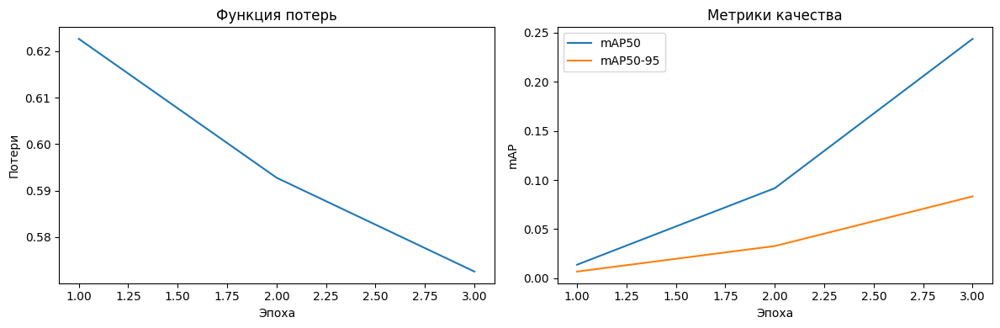

In [ ]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs+1), train_losses)
plt.title('Функция потерь')
plt.xlabel('Эпоха')
plt.ylabel('Потери')

plt.subplot(1, 2, 2)
plt.plot(range(1, num_epochs+1), val_map50, label='mAP50')
plt.plot(range(1, num_epochs+1), val_map50_95, label='mAP50-95')
plt.title('Метрики качества')
plt.xlabel('Эпоха')
plt.ylabel('mAP')
plt.legend()

plt.tight_layout()
plt.show()

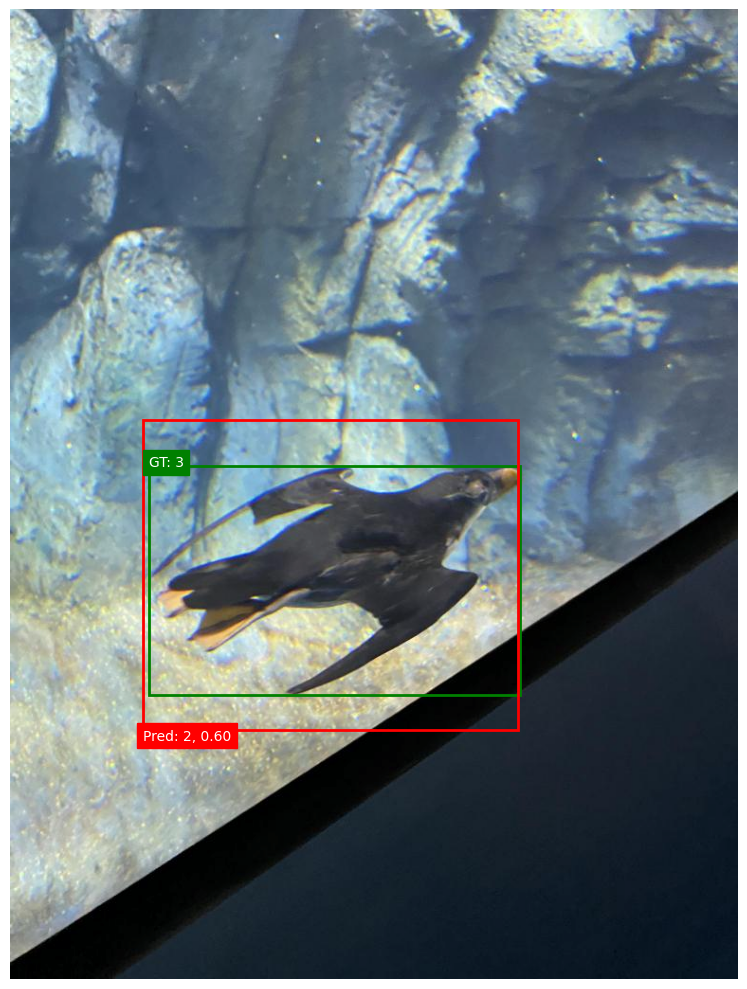

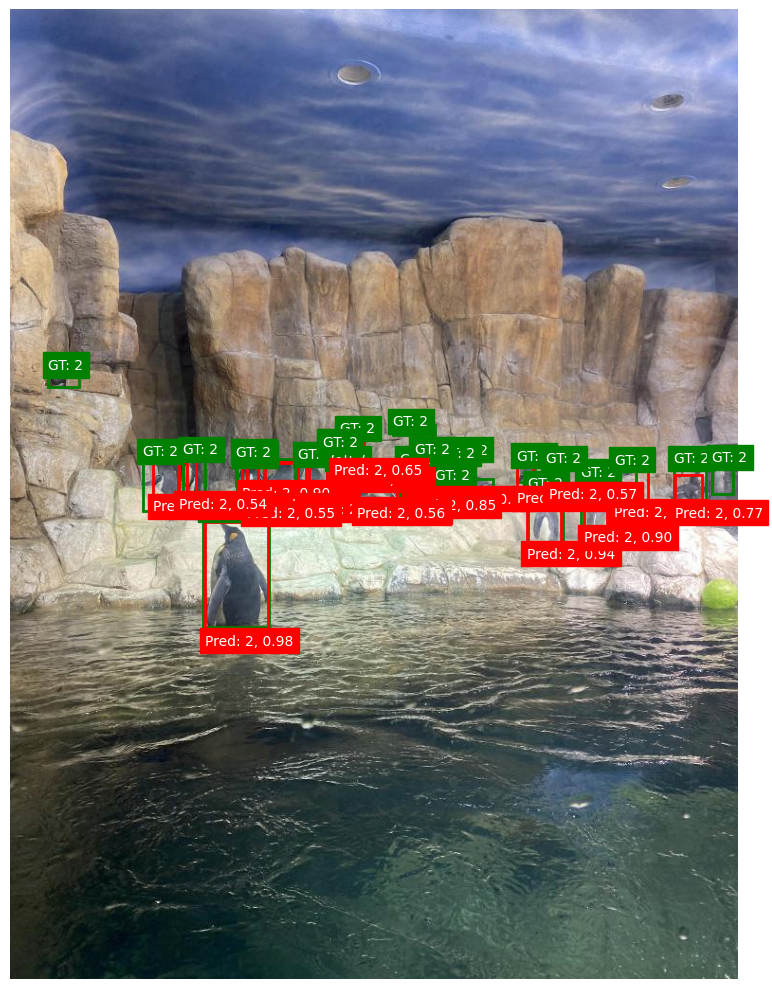

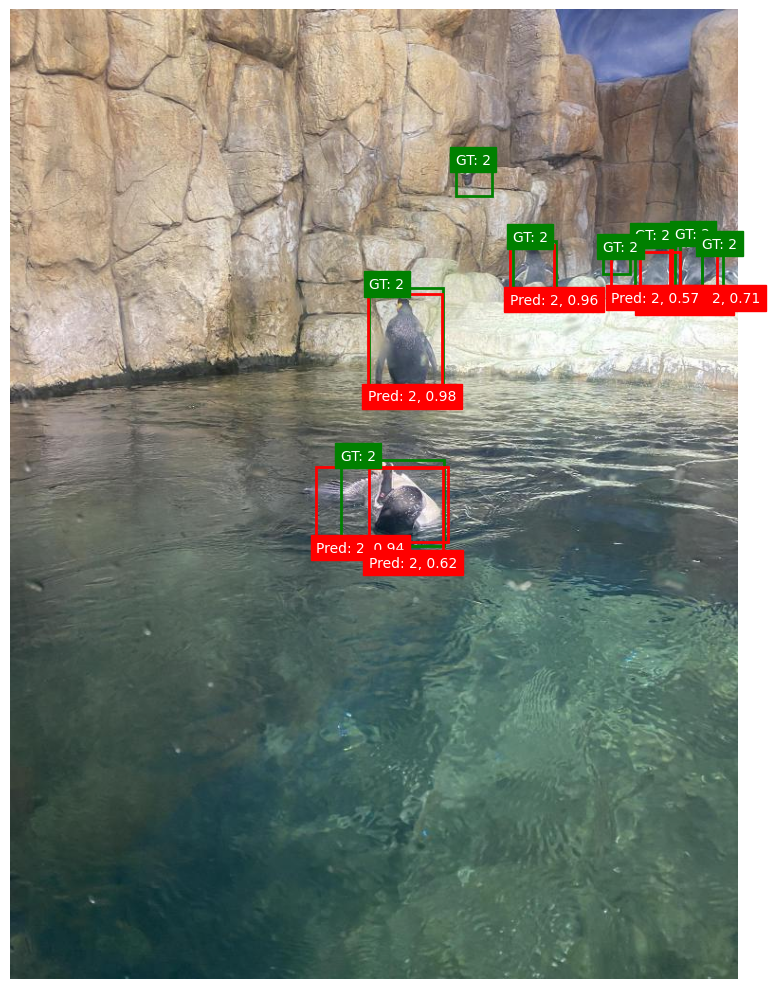

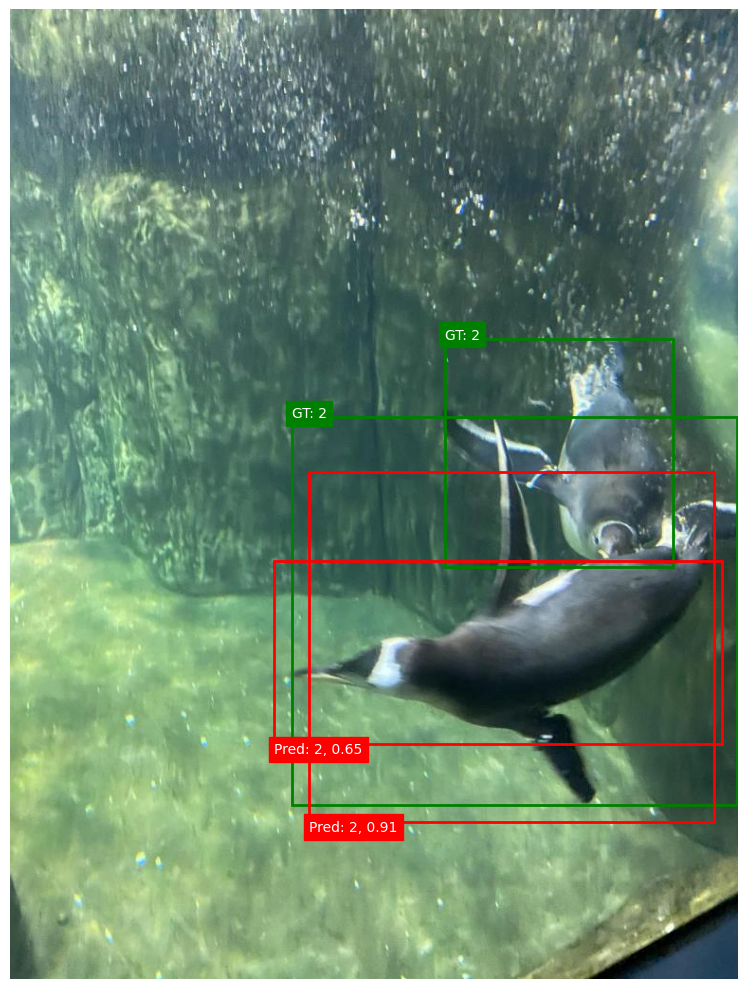

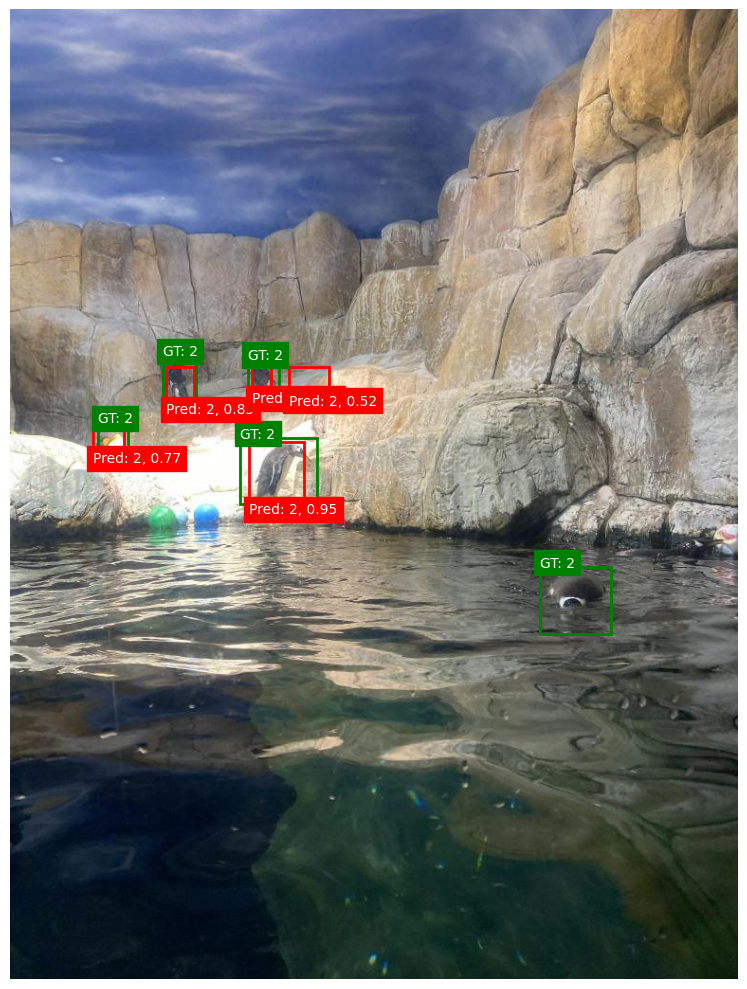

In [ ]:
for i in range(5): 
    visualize_detection(model, test_dataset, i, device)

Попробуем увеличить количество эпох

In [ ]:
num_epochs = 10
train_losses = []
val_map50 = []
val_map50_95 = []

for epoch in range(num_epochs):
    loss = train_one_epoch(model, optimizer, train_loader, device, epoch)
    train_losses.append(loss)
    
    lr_scheduler.step()
    
    ap50, ap50_95 = calculate_map(model, test_loader, device)
    val_map50.append(ap50)
    val_map50_95.append(ap50_95)
    
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {loss:.4f}, mAP50: {ap50:.4f}, mAP50-95: {ap50_95:.4f}")


Epoch: 0, Batch: 0/224, Loss: 0.8737
Epoch: 0, Batch: 20/224, Loss: 0.4255
Epoch: 0, Batch: 40/224, Loss: 0.2553
Epoch: 0, Batch: 60/224, Loss: 0.4322
Epoch: 0, Batch: 80/224, Loss: 0.7958
Epoch: 0, Batch: 100/224, Loss: 0.2626
Epoch: 0, Batch: 120/224, Loss: 0.2801
Epoch: 0, Batch: 140/224, Loss: 1.4358
Epoch: 0, Batch: 160/224, Loss: 0.6564
Epoch: 0, Batch: 180/224, Loss: 0.5571
Epoch: 0, Batch: 200/224, Loss: 0.3462
Epoch: 0, Batch: 220/224, Loss: 0.3919
Epoch 1/10, Loss: 0.5837, mAP50: 0.0762, mAP50-95: 0.0287
Epoch: 1, Batch: 0/224, Loss: 0.4050
Epoch: 1, Batch: 20/224, Loss: 1.2185
Epoch: 1, Batch: 40/224, Loss: 1.2136
Epoch: 1, Batch: 60/224, Loss: 0.3410
Epoch: 1, Batch: 80/224, Loss: 1.0521
Epoch: 1, Batch: 100/224, Loss: 0.3351
Epoch: 1, Batch: 120/224, Loss: 0.5328
Epoch: 1, Batch: 140/224, Loss: 0.2740
Epoch: 1, Batch: 160/224, Loss: 0.1841
Epoch: 1, Batch: 180/224, Loss: 0.8466
Epoch: 1, Batch: 200/224, Loss: 0.7133
Epoch: 1, Batch: 220/224, Loss: 1.1417
Epoch 2/10, Loss: 

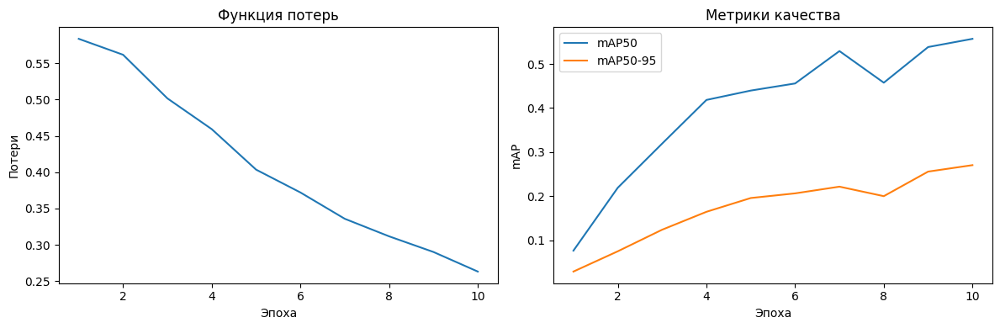

In [ ]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs+1), train_losses)
plt.title('Функция потерь')
plt.xlabel('Эпоха')
plt.ylabel('Потери')

plt.subplot(1, 2, 2)
plt.plot(range(1, num_epochs+1), val_map50, label='mAP50')
plt.plot(range(1, num_epochs+1), val_map50_95, label='mAP50-95')
plt.title('Метрики качества')
plt.xlabel('Эпоха')
plt.ylabel('mAP')
plt.legend()

plt.tight_layout()
plt.show()


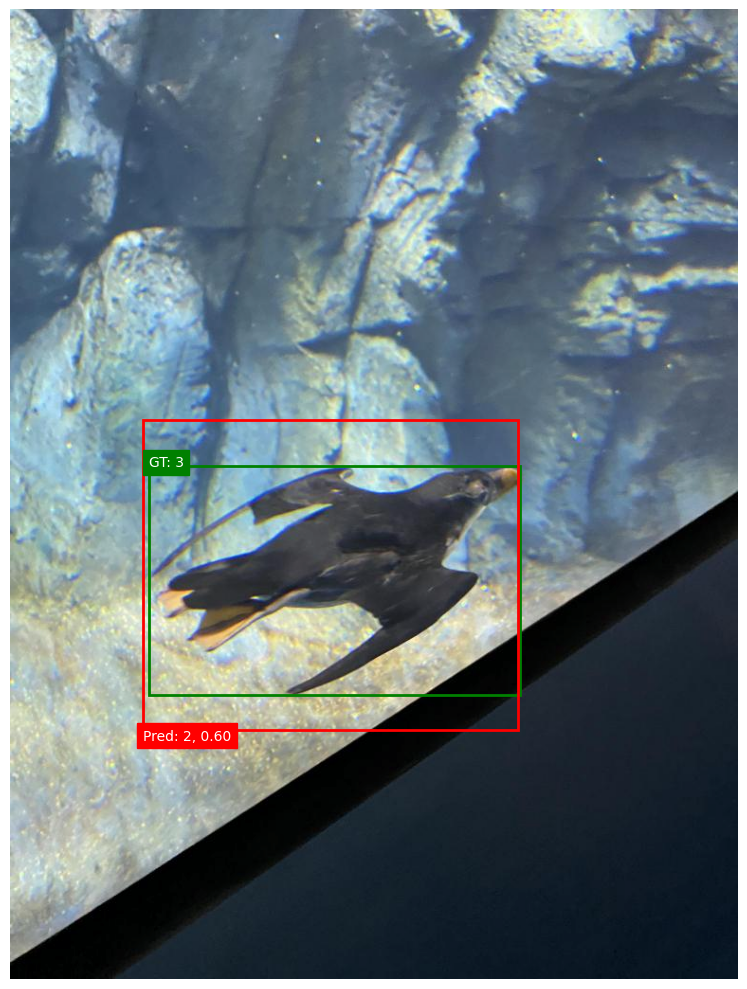

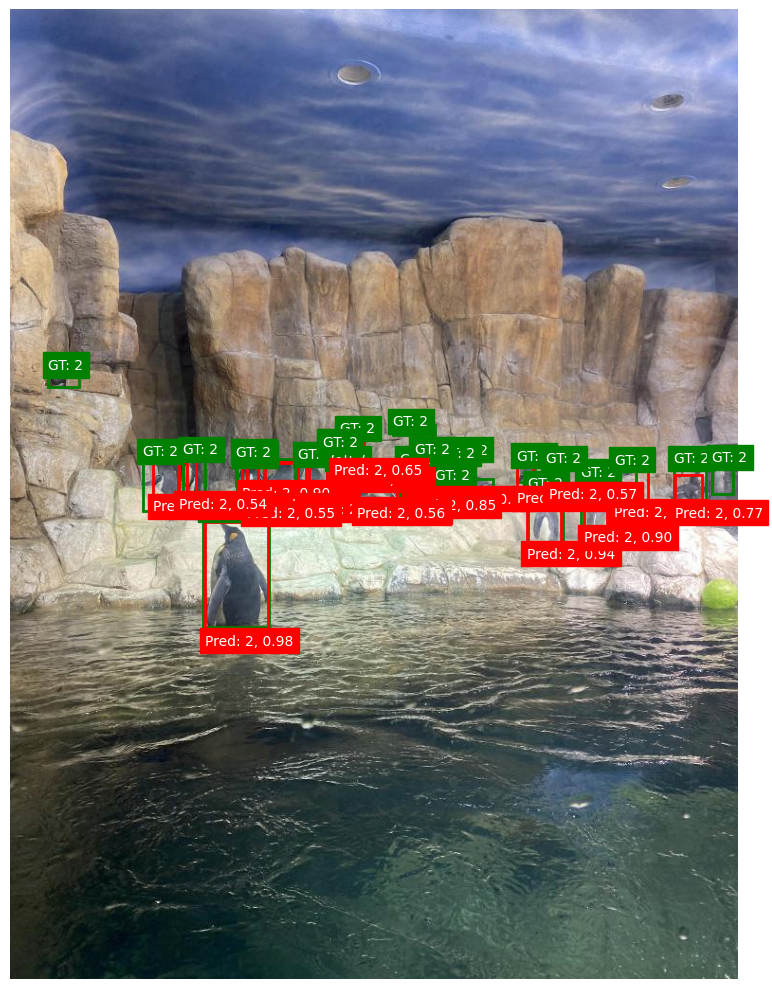

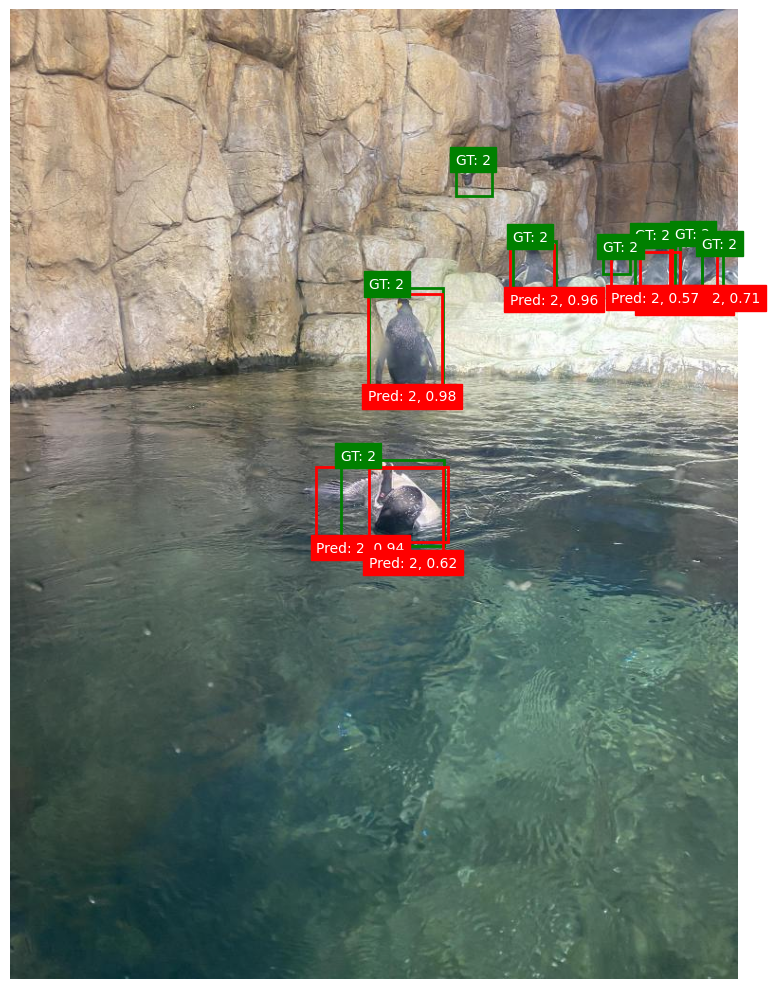

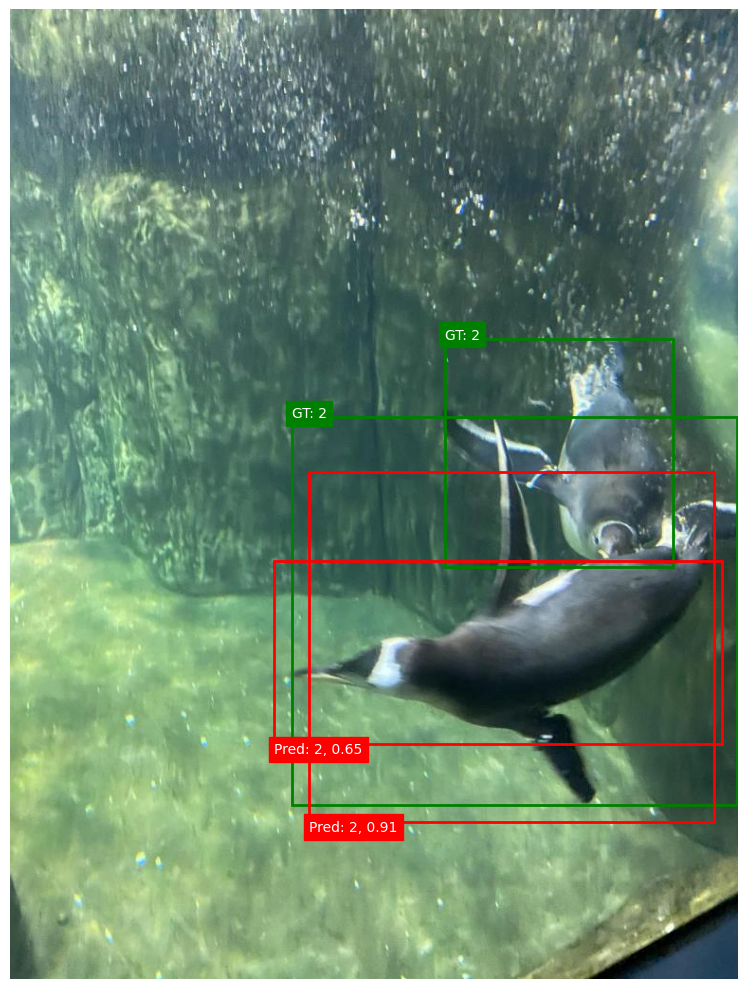

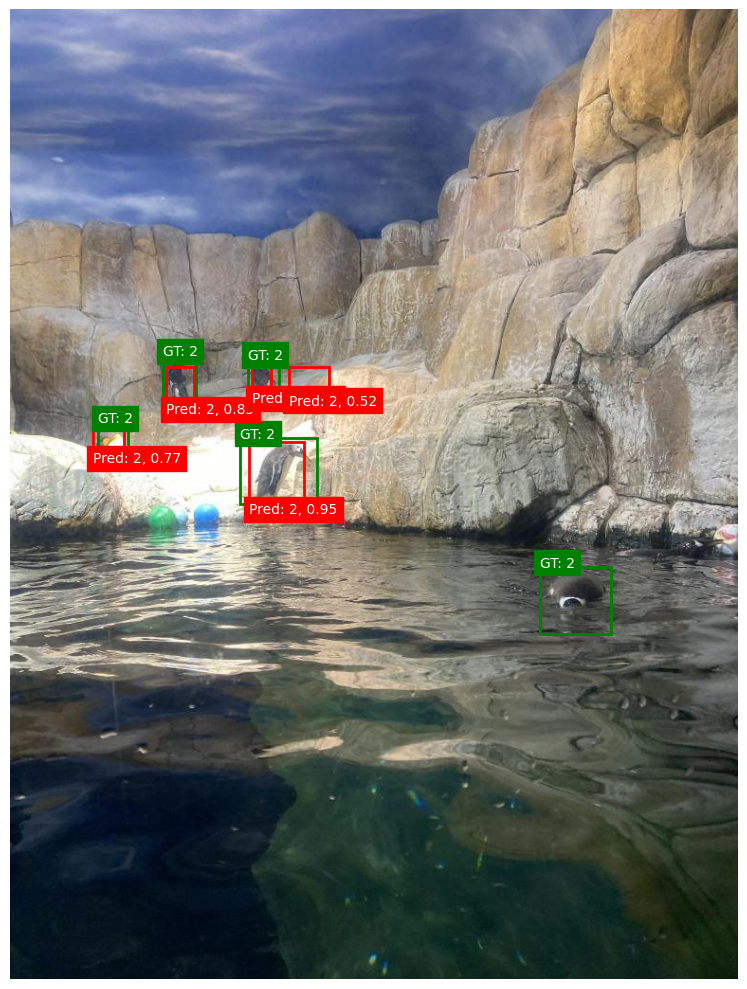

In [ ]:
for i in range(5):
    visualize_detection(model, test_dataset, i, device)


# Итоговый результат

In [86]:
from tabulate import tabulate


table = [
    ["Модель", "mAP50", "mAP50-95"],
    ["YOLO Базовый Baseline", 0.7802, 0.4786],
    ["YOLO Улучшенный Baseline", 0.778740, 0.471125],
    ["Собственная реализация Базовый Baseline", 0.2436, 0.0833],
    ["Собственная реализация Улучшенный Baseline", 0.5570, 0.2703],
]

print(tabulate(table, headers="firstrow", tablefmt="grid"))

+--------------------------------------------+---------+------------+
| Модель                                     |   mAP50 |   mAP50-95 |
+============================================+=========+============+
| YOLO Базовый Baseline                      | 0.7802  |   0.4786   |
+--------------------------------------------+---------+------------+
| YOLO Улучшенный Baseline                   | 0.77874 |   0.471125 |
+--------------------------------------------+---------+------------+
| Собственная реализация Базовый Baseline    | 0.2436  |   0.0833   |
+--------------------------------------------+---------+------------+
| Собственная реализация Улучшенный Baseline | 0.557   |   0.2703   |
+--------------------------------------------+---------+------------+


Встроенная модель YOLO даже на маленьком датасете и недолгим обучением выдает хорошие результаты. Используя улучшенный бейзлайн, удалось получить повышенный recall, что для данного датасета можно считать неплохим результатом.
Собственная реализация справляется похуже, но, вероятно, при более долгом обучении может достигнуть резульатов YOLO.